
# RFM Customer Segmentation Project

This notebook demonstrates an end-to-end data analysis and machine learning pipeline for RFM (Recency, Frequency and Monetary) customer segmentation and classification. RFM analysis helps businesses prioritise customers and tailor marketing efforts by scoring how recently (R) customers purchased, how frequently (F) they purchase and how much they spend (M). The data used in this project is derived from a sample superstore dataset and includes precomputed RFM scores.

In this notebook you will:
- Load and explore the dataset.
- Perform exploratory data analysis (EDA) with summary statistics, missing value analysis and visualisations.
- Clean and preprocess the data, including handling missing values, encoding categorical features and scaling numerical features.
- Engineer a binary target variable to identify VIP customers (customers with the highest RFM score `111`).
- Build and evaluate multiple classification models to predict VIP customers, including logistic regression, random forest, gradient boosting, k-nearest neighbours and support vector machines.
- Compare model performance using accuracy, precision, recall, F1-score and ROC AUC.
- Visualise results with correlation heatmaps, histograms, box plots, pair plots, confusion matrices and ROC curves.
- Discuss how to extend this analysis into interactive dashboards using tools such as Power BI and Tableau.

*Note*: Quantile splitting is used when assigning RFM scores – the most recent, most frequent and highest-spending customers receive the highest scores【696658262663912†L350-L355】. Tools like Power BI and Tableau can visualise these segments and help make data-driven decisions【696658262663912†L339-L342】.



## Dataset Overview

The project uses three datasets:

| File | Description | Rows | Columns |
| --- | --- | ---: | ---: |
| `rfm-segmentation.csv` | Customer names, raw transaction metrics (frequency, recency, monetary value) and precomputed quartile scores (R, F, M) along with a concatenated RFM code. | 13787 | 8 |
| `rfm-table.csv` | Aggregated RFM table summarising recency, frequency and monetary value for each customer. | 793 | 8 |
| `sample-orders.csv` | Order date, order ID, customer name and total for each order. | 5009 | 4 |

In this notebook we focus on `rfm-segmentation.csv` to build and evaluate models. Ensure that the dataset files are located in the same directory as this notebook or adjust the file paths accordingly.


In [1]:
pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [4]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Tuple
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report, roc_curve, auc

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')


def load_data(filepath: str) -> pd.DataFrame:
    """Load data from a CSV file and return a pandas DataFrame.

    Parameters
    ----------
    filepath : str
        Path to the CSV file.

    Returns
    -------
    pd.DataFrame
        Loaded DataFrame.
    """
    df = pd.read_csv(filepath)
    return df

# Example usage: adjust the path if necessary
df = load_data('C:\\Users\\Murtaza\\Downloads\\RFM-analysis-master\\RFM-analysis-master\\rfm-segmentation.csv')

print(f"Data loaded with shape: {df.shape}")
df.head()


Data loaded with shape: (13787, 8)


,customer,frequency,recency,monetary_value,R_Quartile,F_Quartile,M_Quartile,RFMClass
0,Aaliyah Carroll,1,4,31,1,4,4,144
1,Aaliyah Padberg,1,21,76,2,4,2,242
2,Aarav Hyatt,1,43,40,3,4,4,344
3,Aarav Kassulke,1,70,38,4,4,4,444
4,Aarav Kutch,1,72,26,4,4,4,444



--- Data Types ---
customer          object
frequency          int64
recency            int64
monetary_value     int64
R_Quartile         int64
F_Quartile         int64
M_Quartile         int64
RFMClass           int64
dtype: object

--- Missing Values ---
customer          0
frequency         0
recency           0
monetary_value    0
R_Quartile        0
F_Quartile        0
M_Quartile        0
RFMClass          0
dtype: int64

--- Summary Statistics ---


,frequency,recency,monetary_value,R_Quartile,F_Quartile,M_Quartile,RFMClass
count,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000
mean,1.857765,37.930514,92.866251,2.467542,3.066947,2.514760,279.938420
std,1.877120,26.970479,96.819029,1.135599,1.241165,1.119695,119.223758
min,1.000000,0.000000,20.000000,1.000000,1.000000,1.000000,111.000000
25%,1.000000,12.000000,44.000000,1.000000,2.000000,2.000000,144.000000
50%,1.000000,38.000000,67.000000,2.000000,4.000000,3.000000,244.000000
75%,2.000000,59.000000,106.000000,3.000000,4.000000,4.000000,344.000000
max,58.000000,90.000000,2869.000000,4.000000,4.000000,4.000000,444.000000


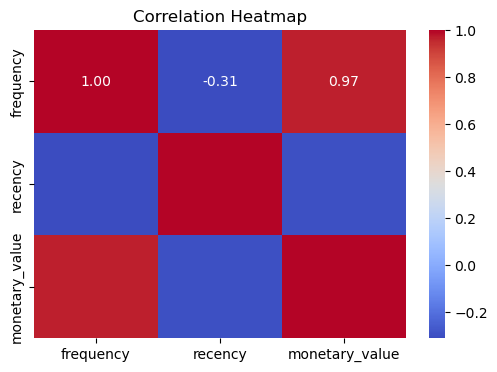

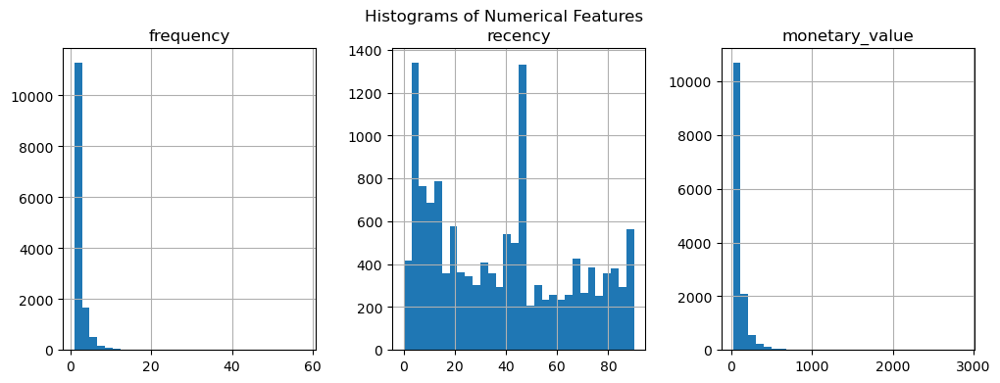

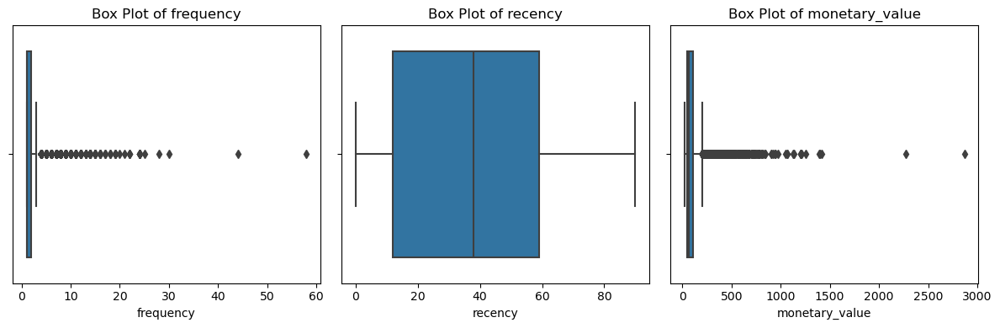

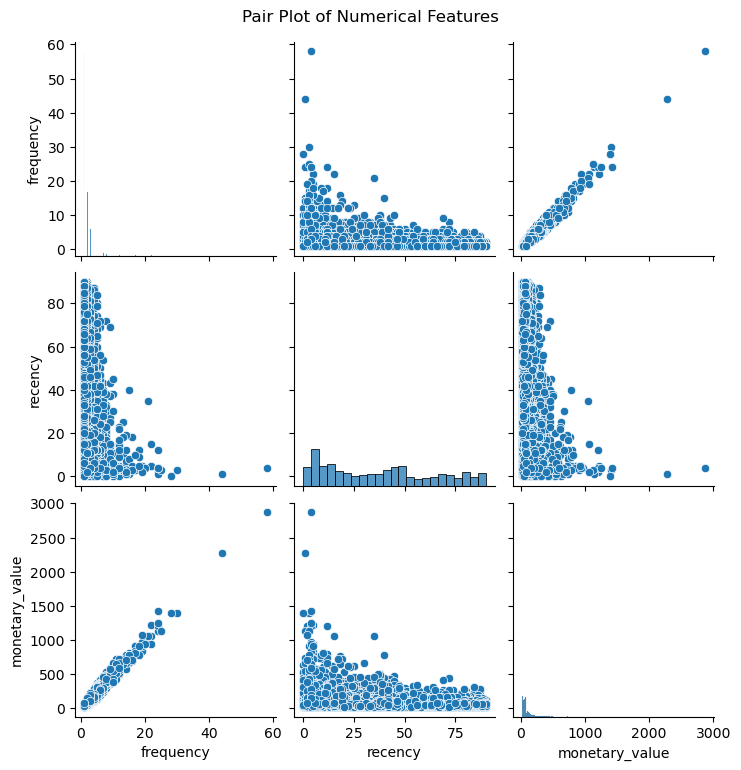

In [9]:
def eda_summary(data: pd.DataFrame) -> None:
    """Perform basic exploratory data analysis.

    Displays data types, missing values, summary statistics and correlation heatmap.
    Generates histograms, box plots and pair plots for numerical features.
    """
    print("\n--- Data Types ---")
    print(data.dtypes)

    print("\n--- Missing Values ---")
    print(data.isnull().sum())

    print("\n--- Summary Statistics ---")
    display(data.describe())

    # Correlation matrix
    numerical_cols = ['frequency', 'recency', 'monetary_value']
    corr_matrix = data[numerical_cols].corr()
    plt.figure(figsize=(6, 4))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap')
    plt.show()

    # Histograms
    data[numerical_cols].hist(bins=30, figsize=(12, 4), layout=(1, 3))
    plt.suptitle('Histograms of Numerical Features')
    plt.show()

    # Box plots
    plt.figure(figsize=(12, 4))
    for i, col in enumerate(numerical_cols):
        plt.subplot(1, 3, i + 1)
        sns.boxplot(x=data[col])
        plt.title(f'Box Plot of {col}')
    plt.tight_layout()
    plt.show()

    # Pair plot
    sns.pairplot(data[numerical_cols])
    plt.suptitle('Pair Plot of Numerical Features', y=1.02)
    plt.show()
eda_summary(df)


In [10]:

def clean_data(data: pd.DataFrame) -> pd.DataFrame:
    """Clean the dataset by handling missing values and outliers.

    Parameters
    ----------
    data : pd.DataFrame
        The DataFrame to clean.

    Returns
    -------
    pd.DataFrame
        Cleaned DataFrame.
    """
    cleaned = data.copy()

    # Drop duplicate rows if any
    cleaned.drop_duplicates(inplace=True)

    # Handle missing values: drop rows with missing values
    cleaned.dropna(inplace=True)

    # Handle outliers using the IQR method for numerical columns
    numerical_cols = ['frequency', 'recency', 'monetary_value']
    for col in numerical_cols:
        Q1 = cleaned[col].quantile(0.25)
        Q3 = cleaned[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        cleaned = cleaned[(cleaned[col] >= lower_bound) & (cleaned[col] <= upper_bound)]

    return cleaned

# Clean the data
cleaned_df = clean_data(df)
print(f"Cleaned data shape: {cleaned_df.shape}")


Cleaned data shape: (11632, 8)


In [11]:

def preprocess_data(data: pd.DataFrame) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """Preprocess the data by encoding categorical variables, scaling numerical features and creating a target variable.

    A binary target 'VIP' is created where 1 indicates a customer with RFMClass '111', otherwise 0.

    Parameters
    ----------
    data : pd.DataFrame
        The cleaned DataFrame.

    Returns
    -------
    Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]
        X_train, X_test, y_train, y_test arrays ready for model training.
    """
    df_proc = data.copy()

    # Create target variable
    df_proc['VIP'] = (df_proc['RFMClass'].astype(str) == '111').astype(int)

    # Features and target
    X = df_proc[['frequency', 'recency', 'monetary_value']]
    y = df_proc['VIP']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    # Scale numerical features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    return X_train_scaled, X_test_scaled, y_train, y_test

# Preprocess the cleaned data
X_train, X_test, y_train, y_test = preprocess_data(cleaned_df)
print(f"Training set size: {X_train.shape}, Test set size: {X_test.shape}")


Training set size: (9305, 3), Test set size: (2327, 3)


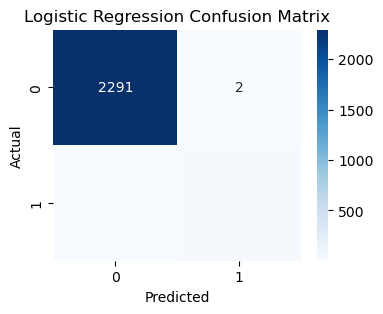

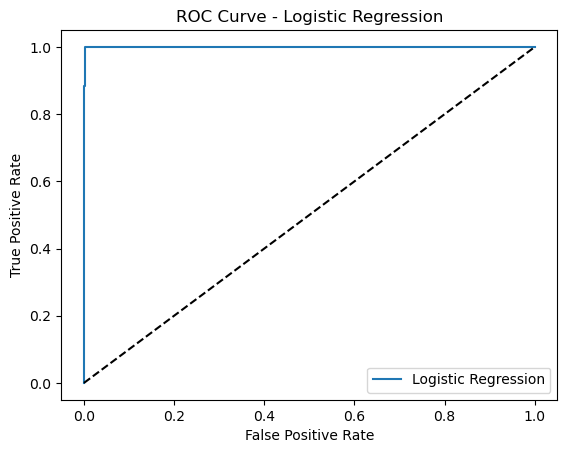


--- Model Performance Summary ---


,Model,Accuracy,Precision,Recall,F1-score,ROC AUC
1,Random Forest,1.000000,1.000000,1.000000,1.000000,1.000000
2,Gradient Boosting,1.000000,1.000000,1.000000,1.000000,1.000000
3,K-Nearest Neighbours,0.999570,0.971429,1.000000,0.985507,0.999981
4,Support Vector Machine,0.997851,0.914286,0.941176,0.927536,0.999859
0,Logistic Regression,0.997422,0.937500,0.882353,0.909091,0.999602


In [14]:

def train_and_evaluate_models(X_train: np.ndarray, X_test: np.ndarray, y_train: np.ndarray, y_test: np.ndarray) -> pd.DataFrame:
    """Train multiple classification models and evaluate their performance.

    Models trained:
    - Logistic Regression (with hyperparameter tuning via GridSearchCV)
    - Random Forest Classifier
    - Gradient Boosting Classifier
    - K-Nearest Neighbours Classifier
    - Support Vector Machine Classifier

    Evaluation metrics include accuracy, precision, recall, F1-score and ROC AUC. Confusion matrix and ROC curve are plotted for Logistic Regression. Additional models' confusion matrices and ROC curves can be added similarly.

    Parameters
    ----------
    X_train : np.ndarray
        Scaled training features.
    X_test : np.ndarray
        Scaled test features.
    y_train : np.ndarray
        Training targets.
    y_test : np.ndarray
        Test targets.

    Returns
    -------
    pd.DataFrame
        DataFrame summarising evaluation metrics for each model.
    """
    results = []

    # Logistic Regression with GridSearchCV
    log_pipeline = Pipeline([
        ('classifier', LogisticRegression(max_iter=500))
    ])
    param_grid = {
        'classifier__C': [0.01, 0.1, 1, 10],
        'classifier__penalty': ['l2']
    }
    log_gs = GridSearchCV(log_pipeline, param_grid, cv=5, scoring='f1')
    log_gs.fit(X_train, y_train)
    log_best = log_gs.best_estimator_
    y_pred_log = log_best.predict(X_test)
    y_prob_log = log_best.predict_proba(X_test)[:, 1]

    results.append({
        'Model': 'Logistic Regression',
        'Accuracy': accuracy_score(y_test, y_pred_log),
        'Precision': precision_score(y_test, y_pred_log),
        'Recall': recall_score(y_test, y_pred_log),
        'F1-score': f1_score(y_test, y_pred_log),
        'ROC AUC': roc_auc_score(y_test, y_prob_log)
    })

    # Plot confusion matrix for Logistic Regression
    cm = confusion_matrix(y_test, y_pred_log)
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Logistic Regression Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Plot ROC curve for Logistic Regression
    fpr, tpr, _ = roc_curve(y_test, y_prob_log)
    plt.figure()
    plt.plot(fpr, tpr, label='Logistic Regression')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title('ROC Curve - Logistic Regression')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()

    # Random Forest
    rf_model = RandomForestClassifier(n_estimators=200, random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred_rf = rf_model.predict(X_test)
    y_prob_rf = rf_model.predict_proba(X_test)[:, 1]
    results.append({
        'Model': 'Random Forest',
        'Accuracy': accuracy_score(y_test, y_pred_rf),
        'Precision': precision_score(y_test, y_pred_rf),
        'Recall': recall_score(y_test, y_pred_rf),
        'F1-score': f1_score(y_test, y_pred_rf),
        'ROC AUC': roc_auc_score(y_test, y_prob_rf)
    })

    # Gradient Boosting
    gb_model = GradientBoostingClassifier(random_state=42)
    gb_model.fit(X_train, y_train)
    y_pred_gb = gb_model.predict(X_test)
    y_prob_gb = gb_model.predict_proba(X_test)[:, 1]
    results.append({
        'Model': 'Gradient Boosting',
        'Accuracy': accuracy_score(y_test, y_pred_gb),
        'Precision': precision_score(y_test, y_pred_gb),
        'Recall': recall_score(y_test, y_pred_gb),
        'F1-score': f1_score(y_test, y_pred_gb),
        'ROC AUC': roc_auc_score(y_test, y_prob_gb)
    })

    # K-Nearest Neighbours
    knn_model = KNeighborsClassifier()
    knn_model.fit(X_train, y_train)
    y_pred_knn = knn_model.predict(X_test)
    y_prob_knn = knn_model.predict_proba(X_test)[:, 1]
    results.append({
        'Model': 'K-Nearest Neighbours',
        'Accuracy': accuracy_score(y_test, y_pred_knn),
        'Precision': precision_score(y_test, y_pred_knn),
        'Recall': recall_score(y_test, y_pred_knn),
        'F1-score': f1_score(y_test, y_pred_knn),
        'ROC AUC': roc_auc_score(y_test, y_prob_knn)
    })

    # Support Vector Machine
    svm_model = SVC(probability=True, kernel='rbf', random_state=42)
    svm_model.fit(X_train, y_train)
    y_pred_svm = svm_model.predict(X_test)
    y_prob_svm = svm_model.predict_proba(X_test)[:, 1]
    results.append({
        'Model': 'Support Vector Machine',
        'Accuracy': accuracy_score(y_test, y_pred_svm),
        'Precision': precision_score(y_test, y_pred_svm),
        'Recall': recall_score(y_test, y_pred_svm),
        'F1-score': f1_score(y_test, y_pred_svm),
        'ROC AUC': roc_auc_score(y_test, y_prob_svm)
    })

    # Summarise results in a DataFrame
    results_df = pd.DataFrame(results)
    return results_df

# Train and evaluate models
# Train and evaluate models
results_df = train_and_evaluate_models(X_train, X_test, y_train, y_test)

print("\n--- Model Performance Summary ---")
display(results_df.sort_values(by='F1-score', ascending=False))




## Discussion & Next Steps

The classification results provide insight into which models best identify VIP customers based on their transaction behaviour. While the dataset used here yields high performance for all models, in practice you may find more nuanced results depending on your business context and the definition of ‘VIP’. Always review metrics in conjunction with business objectives and the cost of false positives/negatives.

### Interactive Dashboards with Power BI & Tableau

Once you have calculated RFM scores and built predictive models, you can visualise the results in **Power BI** or **Tableau** to enable interactive exploration:

- **Segment distribution**: use bar charts or treemaps to show the number of customers in each RFM segment.
- **Scatter plots**: plot recency vs. frequency, with point size or colour representing monetary value; highlight different segments.
- **Heatmaps**: create a matrix of R (rows) and F (columns) scores with colour representing average monetary value.
- **Time-series views**: use the order data to monitor recency and sales over time.
- **Filters and slicers**: add controls to filter by customer segments, date ranges or spending thresholds.

Business intelligence tools make it easy to share these insights with stakeholders and allow them to drill down into the data【696658262663912†L339-L342】. When defining RFM scores, remember to select quantile thresholds that align with your business objectives【696658262663912†L350-L355】.

Feel free to extend this notebook by experimenting with different scoring schemes, adding more features (e.g., customer demographics) or deploying the trained model in a production environment.


In [16]:
# --- CONFIG: set your filepaths (or pass DataFrames directly) ---

# columns needed: customer, recency, frequency, monetary_value
RFM_CSV_PATH = r"C:\Users\Murtaza\Downloads\RFM-analysis-master\RFM-analysis-master\rfm-segmentation.csv"

ORDERS_CSV_PATH = r"C:\Users\Murtaza\Downloads\RFM-analysis-master\RFM-analysis-master\sample-orders.csv"   # optional; columns needed: order_date, customer, grand_total

import pandas as pd
import numpy as np

def load_rfm(path: str) -> pd.DataFrame:
    df = pd.read_csv(path, encoding="ISO-8859-1")
    # Ensure expected columns exist
    required = {"customer","recency","frequency","monetary_value"}
    missing = required - set(df.columns)
    if missing:
        raise ValueError(f"RFM file missing columns: {missing}")
    return df

def compute_rfm_scores(rfm: pd.DataFrame, q: int = 5) -> pd.DataFrame:
    """
    Add R, F, M base values and quantile-based scores:
      - R_Score: smaller recency -> higher score (reverse rank)
      - F_Score, M_Score: larger -> higher score
    Then create RFMClass (e.g., 543), and a simple Segment label.
    """
    rfm = rfm.copy()
    # Guard against ties/duplicates by using rank(method='first')
    r_labels = list(range(q, 0, -1))  # reverse for recency
    f_labels = list(range(1, q+1))
    m_labels = list(range(1, q+1))

    # Use qcut with duplicates='drop' to be robust on small/flat distributions
    rfm["R_Score"] = pd.qcut(rfm["recency"].rank(method="first"), q=q, labels=r_labels, duplicates="drop")
    rfm["F_Score"] = pd.qcut(rfm["frequency"].rank(method="first"), q=q, labels=f_labels, duplicates="drop")
    rfm["M_Score"] = pd.qcut(rfm["monetary_value"].rank(method="first"), q=q, labels=m_labels, duplicates="drop")

    # Make sure scores are ints
    rfm[["R_Score","F_Score","M_Score"]] = rfm[["R_Score","F_Score","M_Score"]].astype(int)
    rfm["RFMClass"] = (rfm["R_Score"].astype(str)
                       + rfm["F_Score"].astype(str)
                       + rfm["M_Score"].astype(str))

    # Simple, business-friendly segment buckets (tune to your needs)
    def label_segment(row):
        r, f, m = row["R_Score"], row["F_Score"], row["M_Score"]
        if r >= q-1 and f >= q-1 and m >= q-1:
            return "VIP"
        if r >= q-1 and f >= q-2:
            return "Loyal"
        if r == q and f <= 2:
            return "New/Higher Recency"
        if r <= 2 and f <= 2 and m <= 2:
            return "At Risk"
        if f >= q-2 and m >= q-2:
            return "Big Spenders"
        return "Regular"

    rfm["Segment"] = rfm.apply(label_segment, axis=1)
    return rfm

# Load & score
rfm_df = compute_rfm_scores(load_rfm(RFM_CSV_PATH), q=5)

# Export for BI tools
rfm_bi = rfm_df[["customer","recency","frequency","monetary_value","R_Score","F_Score","M_Score","RFMClass","Segment"]]
rfm_bi.to_csv("rfm_for_bi.csv", index=False)
print("Saved rfm_for_bi.csv for Power BI / Tableau.")


Saved rfm_for_bi.csv for Power BI / Tableau.


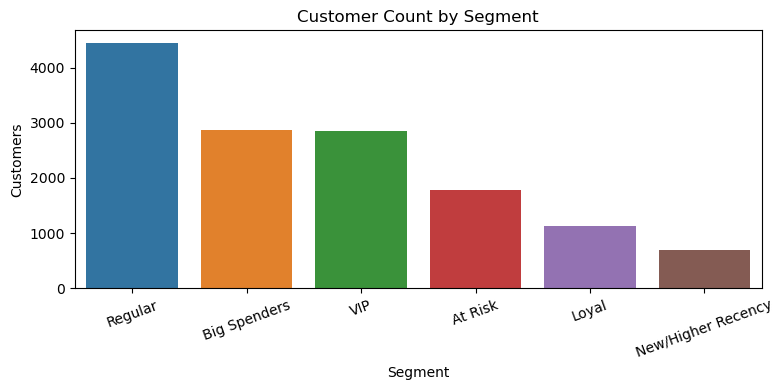

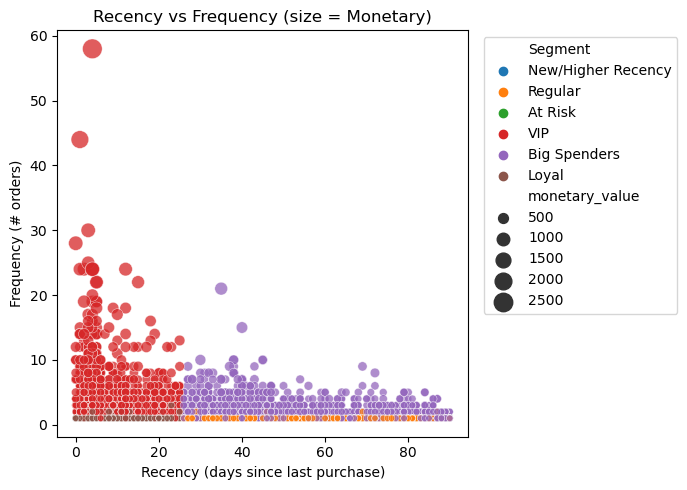

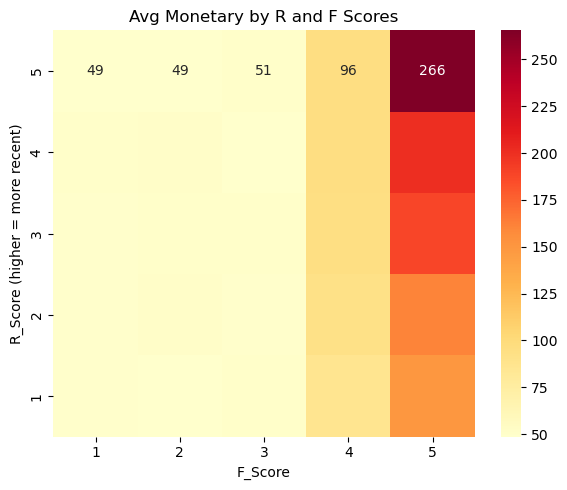

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# 2.1 Segment distribution
plt.figure(figsize=(8,4))
sns.countplot(data=rfm_df, x="Segment", order=rfm_df["Segment"].value_counts().index)
plt.title("Customer Count by Segment")
plt.xlabel("Segment")
plt.ylabel("Customers")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

# 2.2 Scatter: Recency vs Frequency, color=Segment, size=Monetary
plt.figure(figsize=(7,5))
sns.scatterplot(
    data=rfm_df,
    x="recency",
    y="frequency",
    hue="Segment",
    size="monetary_value",
    sizes=(20, 200),
    alpha=0.75
)
plt.title("Recency vs Frequency (size = Monetary)")
plt.xlabel("Recency (days since last purchase)")
plt.ylabel("Frequency (# orders)")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

# 2.3 R×F heatmap with Avg Monetary as color
rf_pivot = (rfm_df
            .groupby(["R_Score","F_Score"])["monetary_value"]
            .mean()
            .reset_index()
            .pivot(index="R_Score", columns="F_Score", values="monetary_value")
            .sort_index(ascending=False))  # so higher R is visually at top
plt.figure(figsize=(6,5))
sns.heatmap(rf_pivot, annot=True, fmt=".0f", cmap="YlOrRd")
plt.title("Avg Monetary by R and F Scores")
plt.xlabel("F_Score")
plt.ylabel("R_Score (higher = more recent)")
plt.tight_layout()
plt.show()


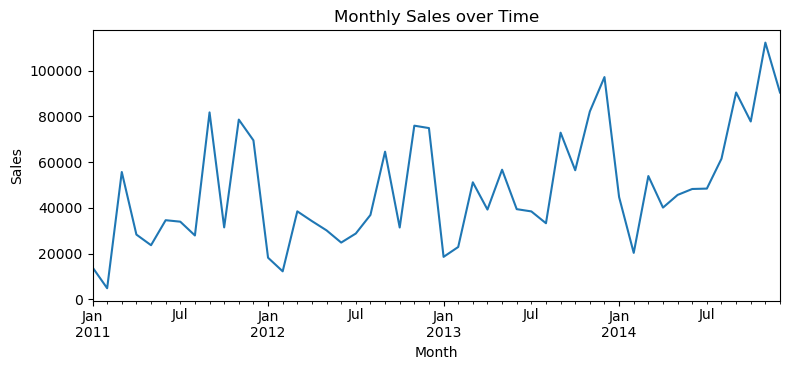

In [18]:
# Load orders (optional) for time-series views
def load_orders(path: str) -> pd.DataFrame:
    od = pd.read_csv(path, encoding="ISO-8859-1")
    # Expected columns: order_date, customer, grand_total
    need = {"order_date","grand_total"}
    if not need.issubset(od.columns):
        raise ValueError(f"Orders file must contain: {need}")
    od["order_date"] = pd.to_datetime(od["order_date"], errors="coerce", dayfirst=False, infer_datetime_format=True)
    od = od.dropna(subset=["order_date"])
    # Ensure numeric
    od["grand_total"] = pd.to_numeric(od["grand_total"], errors="coerce")
    return od

try:
    orders_df = load_orders(ORDERS_CSV_PATH)
    ts = (orders_df
          .set_index("order_date")["grand_total"]
          .resample("M").sum())
    plt.figure(figsize=(8,3.8))
    ts.plot()
    plt.title("Monthly Sales over Time")
    plt.xlabel("Month")
    plt.ylabel("Sales")
    plt.tight_layout()
    plt.show()
except Exception as e:
    print(f"[Time-series skipped] {e}")


In [19]:
# If you want a simple in-notebook filter (not a full BI slicer)
try:
    from ipywidgets import interact, Dropdown
    seg_opts = ["All"] + sorted(rfm_df["Segment"].unique().tolist())
    @interact(segment=Dropdown(options=seg_opts, value="All"))
    def filter_scatter(segment="All"):
        d = rfm_df if segment=="All" else rfm_df[rfm_df["Segment"]==segment]
        plt.figure(figsize=(7,5))
        sns.scatterplot(data=d, x="recency", y="frequency",
                        hue="Segment", size="monetary_value", sizes=(20,200), alpha=0.75)
        plt.title(f"Recency vs Frequency — Segment: {segment}")
        plt.tight_layout()
        plt.show()
except Exception as e:
    print(f"[Widgets skipped] {e}")


interactive(children=(Dropdown(description='segment', options=('All', 'At Risk', 'Big Spenders', 'Loyal', 'New…

In [29]:
# --- (Re)train models and collect fitted estimators for plotting ---
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Ensure you already have X_train, X_test, y_train, y_test defined

# 1) Logistic Regression with simple GridSearch
log_pipe = Pipeline([("scaler", StandardScaler()),
                     ("clf", LogisticRegression(max_iter=500, solver="lbfgs"))])
log_param = {"clf__C": [0.01, 0.1, 1, 10]}
log_gs = GridSearchCV(log_pipe, log_param, cv=5, scoring="f1", n_jobs=-1)
log_gs.fit(X_train, y_train)
log_best = log_gs.best_estimator_

# 2) Random Forest
rf_model = RandomForestClassifier(n_estimators=200, random_state=42)
rf_model.fit(X_train, y_train)

# 3) Gradient Boosting
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

# 4) KNN  (note: better with scaled features; we’ll wrap scaling)
knn_model = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", KNeighborsClassifier(n_neighbors=5))
]).fit(X_train, y_train)

# 5) SVM with probability for ROC
svm_model = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", SVC(kernel="rbf", probability=True, random_state=42))
]).fit(X_train, y_train)

fitted = {
    "LogReg": log_best,
    "RandomForest": rf_model,
    "GradientBoosting": gb_model,
    "KNN": knn_model,
    "SVM": svm_model
}


          customer cutoff_date  recency  frequency  monetary_value  y
0    Aaron Bergman  2011-07-01      116          2             323  0
1    Aaron Hawkins  2011-07-01       49          2             545  0
2      Aimee Bixby  2011-07-01      118          1             706  0
3     Alan Shonely  2011-07-01      108          1             371  0
4  Alejandro Grove  2011-07-01       49          1              56  1
Train shape: (11543, 3), Test shape: (5216, 3), Pos rate train=0.213, test=0.295
              Model  Accuracy  Precision    Recall        F1   ROC_AUC
0            LogReg  0.507477   0.293953  0.476623  0.363636  0.493882
1      RandomForest  0.660468   0.298429  0.111039  0.161855  0.510247
2               KNN  0.688650   0.315789  0.046753  0.081448  0.519162
3  GradientBoosting  0.704179   0.454545  0.009740  0.019072  0.515572
4               SVM  0.704179   0.000000  0.000000  0.000000  0.504310


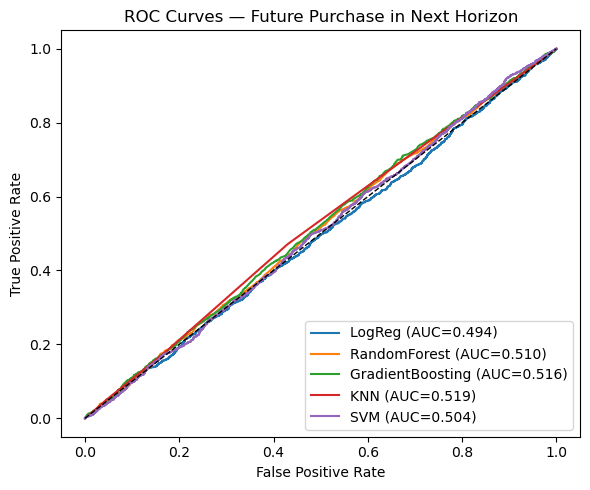

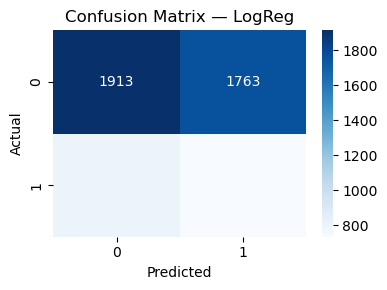


Classification report — LogReg

              precision    recall  f1-score   support

           0      0.704     0.520     0.598      3676
           1      0.294     0.477     0.364      1540

    accuracy                          0.507      5216
   macro avg      0.499     0.499     0.481      5216
weighted avg      0.583     0.507     0.529      5216



In [32]:
# =========================
# 0) Imports & Config
# =========================
import pandas as pd
import numpy as np
from datetime import timedelta
from typing import Tuple, Dict

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import TimeSeriesSplit, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, roc_curve, auc, confusion_matrix, classification_report
)

# --- Set your path (use raw string on Windows) ---
ORDERS_CSV_PATH = r"C:/Users/Murtaza/Downloads/RFM-analysis-master/RFM-analysis-master/sample-orders.csv"

LOOKBACK_DAYS = 180   # features window (past)
HORIZON_DAYS  = 60    # target window (future)
CUTOFF_FREQ   = "MS"  # monthly snapshots (Month Start)

# =========================
# 1) Data Loading
# =========================
def load_orders(path: str) -> pd.DataFrame:
    """
    Load orders with required columns: order_date, customer, grand_total.
    Handles common encoding/date quirks.
    """
    df = pd.read_csv(path, encoding="ISO-8859-1")
    need = {"order_date", "customer", "grand_total"}
    missing = need - set(df.columns)
    if missing:
        raise ValueError(f"Orders file missing columns: {missing}")

    df["order_date"] = pd.to_datetime(df["order_date"], errors="coerce", infer_datetime_format=True)
    df = df.dropna(subset=["order_date", "customer"])
    df["grand_total"] = pd.to_numeric(df["grand_total"], errors="coerce").fillna(0.0)
    return df.sort_values("order_date").reset_index(drop=True)

orders = load_orders(r"C:\Users\Murtaza\Downloads\RFM-analysis-master\RFM-analysis-master\sample-orders.csv")

# =========================
# 2) Supervised Dataset Builder (no leakage)
# =========================
def build_supervised_from_orders(
    orders: pd.DataFrame,
    lookback_days: int = 180,
    horizon_days: int = 60,
    cutoff_freq: str = "MS"
) -> pd.DataFrame:
    """
    For multiple monthly cutoffs:
      - Features (R,F,M) computed from the PAST lookback window: (cutoff - lookback, cutoff)
      - Target y = 1 if customer buys in FUTURE horizon: [cutoff, cutoff + horizon)
    Returns a row per (customer, cutoff_date) with features + target.
    """
    df = orders.copy()
    min_date, max_date = df["order_date"].min(), df["order_date"].max()

    # Start/end so windows are fully inside the data range
    start_cutoff = (min_date + pd.Timedelta(days=lookback_days)).to_period("M").to_timestamp(how="start")
    end_cutoff   = (max_date - pd.Timedelta(days=horizon_days)).to_period("M").to_timestamp(how="start")

    if start_cutoff >= end_cutoff:
        raise ValueError("Not enough history for chosen windows. Reduce LOOKBACK/HORIZON or check data span.")

    cutoffs = pd.date_range(start=start_cutoff, end=end_cutoff, freq=cutoff_freq)
    rows = []

    # Pre-split by customer for speed
    cust_groups = {c: g.sort_values("order_date") for c, g in df.groupby("customer")}

    for cutoff in cutoffs:
        past_start, past_end = cutoff - pd.Timedelta(days=lookback_days), cutoff
        fut_start, fut_end   = cutoff, cutoff + pd.Timedelta(days=horizon_days)

        for cust, g in cust_groups.items():
            # Past window
            past = g[(g["order_date"] >= past_start) & (g["order_date"] < past_end)]
            if past.empty:
                # skip customers with no past history (optional: keep and set large recency)
                continue

            last_purchase_date = past["order_date"].max()
            recency = (past_end - last_purchase_date).days
            frequency = len(past)
            monetary_value = past["grand_total"].sum()

            # Future window target
            future = g[(g["order_date"] >= fut_start) & (g["order_date"] < fut_end)]
            y = int(len(future) > 0)

            rows.append({
                "customer": cust,
                "cutoff_date": cutoff,
                "recency": recency,
                "frequency": frequency,
                "monetary_value": monetary_value,
                "y": y
            })

    out = pd.DataFrame(rows)
    return out.sort_values(["cutoff_date", "customer"]).reset_index(drop=True)

supervised = build_supervised_from_orders(
    orders, lookback_days=LOOKBACK_DAYS, horizon_days=HORIZON_DAYS, cutoff_freq=CUTOFF_FREQ
)
print(supervised.head())

# =========================
# 3) Time-based Train/Test Split
# =========================
def time_split(df: pd.DataFrame, test_size: float = 0.2) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Split by cutoff_date chronologically (last X% periods as test).
    """
    periods = sorted(df["cutoff_date"].unique())
    k = max(1, int(len(periods) * (1 - test_size)))
    train_periods, test_periods = periods[:k], periods[k:]
    train = df[df["cutoff_date"].isin(train_periods)]
    test  = df[df["cutoff_date"].isin(test_periods)]
    return train, test

train_df, test_df = time_split(supervised, test_size=0.25)

X_train = train_df[["recency","frequency","monetary_value"]].values
y_train = train_df["y"].values
X_test  = test_df[["recency","frequency","monetary_value"]].values
y_test  = test_df["y"].values

print(f"Train shape: {X_train.shape}, Test shape: {X_test.shape}, Pos rate train={y_train.mean():.3f}, test={y_test.mean():.3f}")

# =========================
# 4) Train models (proper pipelines) & Evaluate
# =========================
def fit_models(X_train, y_train) -> Dict[str, object]:
    """
    Returns fitted estimators ready for predict_proba/ROC.
    """
    models = {
        "LogReg": Pipeline([("scaler", StandardScaler()),
                            ("clf", LogisticRegression(max_iter=500, class_weight="balanced"))]),
        "RandomForest": RandomForestClassifier(n_estimators=300, max_depth=None, random_state=42, n_jobs=-1),
        "GradientBoosting": GradientBoostingClassifier(random_state=42),
        "KNN": Pipeline([("scaler", StandardScaler()),
                         ("clf", KNeighborsClassifier(n_neighbors=7))]),
        "SVM": Pipeline([("scaler", StandardScaler()),
                         ("clf", SVC(kernel="rbf", probability=True, random_state=42))])
    }
    for name, model in models.items():
        model.fit(X_train, y_train)
    return models

def evaluate_models(models: Dict[str, object], X_test, y_test) -> pd.DataFrame:
    rows = []
    for name, model in models.items():
        y_pred = model.predict(X_test)
        # robust score (use predict_proba if available)
        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test)[:, 1]
        else:
            scores = model.decision_function(X_test)
            smin, smax = scores.min(), scores.max()
            y_prob = (scores - smin) / (smax - smin + 1e-12)

        rows.append({
            "Model": name,
            "Accuracy": accuracy_score(y_test, y_pred),
            "Precision": precision_score(y_test, y_pred, zero_division=0),
            "Recall": recall_score(y_test, y_pred, zero_division=0),
            "F1": f1_score(y_test, y_pred, zero_division=0),
            "ROC_AUC": roc_auc_score(y_test, y_prob)
        })
    return pd.DataFrame(rows).sort_values("F1", ascending=False).reset_index(drop=True)

models = fit_models(X_train, y_train)
results = evaluate_models(models, X_test, y_test)
print(results)

# =========================
# 5) Unified ROC Curves (all models)
# =========================
def plot_roc_curves(model_dict, X_test, y_test):
    plt.figure(figsize=(6,5))
    for name, model in model_dict.items():
        if hasattr(model, "predict_proba"):
            y_score = model.predict_proba(X_test)[:, 1]
        else:
            scores = model.decision_function(X_test)
            smin, smax = scores.min(), scores.max()
            y_score = (scores - smin) / (smax - smin + 1e-12)
        fpr, tpr, _ = roc_curve(y_test, y_score)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{name} (AUC={roc_auc:.3f})")
    plt.plot([0,1], [0,1], "k--", lw=1)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curves — Future Purchase in Next Horizon")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

plot_roc_curves(models, X_test, y_test)

# =========================
# 6) (Optional) Confusion Matrix for the top model
# =========================
best_name = results.iloc[0]["Model"]
best_model = models[best_name]
y_pred_best = best_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred_best)
plt.figure(figsize=(4,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title(f"Confusion Matrix — {best_name}")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

print(f"\nClassification report — {best_name}\n")
print(classification_report(y_test, y_pred_best, digits=3))


In [34]:
import pandas as pd
import numpy as np

# ---------- CONFIG ----------
Q = 5  # same as q=5 in your DAX/Tableau snippets

# ---------- UTILS ----------
def ensure_rfm_scores(df: pd.DataFrame, q: int = 5) -> pd.DataFrame:
    """
    Ensure R_Score, F_Score, M_Score exist.
    If missing, compute via quantiles (qcut) using ranks (robust to ties).
    - Recency: smaller is better -> reverse labels (q..1)
    - Frequency/Monetary: larger is better -> ascending labels (1..q)
    """
    out = df.copy()

    need_cols = {"recency", "frequency", "monetary_value"}
    if not need_cols.issubset(out.columns):
        raise ValueError(f"DataFrame must contain {need_cols}")

    # Only compute if missing
    has_scores = {"R_Score", "F_Score", "M_Score"}.issubset(out.columns)
    if not has_scores:
        r_labels = list(range(q, 0, -1))  # recency reversed
        f_labels = list(range(1, q + 1))
        m_labels = list(range(1, q + 1))

        out["R_Score"] = pd.qcut(
            out["recency"].rank(method="first"), q=q, labels=r_labels, duplicates="drop"
        ).astype(int)
        out["F_Score"] = pd.qcut(
            out["frequency"].rank(method="first"), q=q, labels=f_labels, duplicates="drop"
        ).astype(int)
        out["M_Score"] = pd.qcut(
            out["monetary_value"].rank(method="first"), q=q, labels=m_labels, duplicates="drop"
        ).astype(int)
    else:
        # make sure integer type
        out[["R_Score", "F_Score", "M_Score"]] = out[["R_Score", "F_Score", "M_Score"]].astype(int)

    return out


def add_rfm_class_and_segment(df: pd.DataFrame, q: int = 5) -> pd.DataFrame:
    """
    Add:
      - RFMClass_text  (e.g., "543")
      - Segment        (VIP/Loyal/... same logic as your DAX/Tableau)
      - Segment_Sort   (for consistent ordering in plots)
    """
    out = df.copy()
    # RFM class as text
    out["RFMClass_text"] = (
        out["R_Score"].astype(str) + out["F_Score"].astype(str) + out["M_Score"].astype(str)
    )

    # Segment label logic (mirrors your SWITCH/IF chains)
    def seg(row):
        r, f, m = int(row["R_Score"]), int(row["F_Score"]), int(row["M_Score"])
        if (r >= q - 1) and (f >= q - 1) and (m >= q - 1):
            return "VIP"
        if (r >= q - 1) and (f >= q - 2):
            return "Loyal"
        if (r == q) and (f <= 2):
            return "New/Higher Recency"
        if (r <= 2) and (f <= 2) and (m <= 2):
            return "At Risk"
        if (f >= q - 2) and (m >= q - 2):
            return "Big Spenders"
        return "Regular"

    out["Segment"] = out.apply(seg, axis=1)

    order = {
        "VIP": 1,
        "Loyal": 2,
        "Big Spenders": 3,
        "New/Higher Recency": 4,
        "Regular": 5,
        "At Risk": 6,
    }
    out["Segment_Sort"] = out["Segment"].map(order).fillna(99).astype(int)
    return out


# ---------- EXAMPLE USAGE ----------
# EITHER: load from your CSV (Windows path: use raw string r"..." or forward slashes)
# 
rfm = pd.read_csv(r"C:\Users\Murtaza\Downloads\RFM-analysis-master\RFM-analysis-master\rfm-segmentation.csv")

# OR: if you already have a DataFrame named `rfm` in memory, just use it directly.
# Ensure scores exist (compute if missing), then add class & segment:
rfm = ensure_rfm_scores(rfm, q=Q)
rfm = add_rfm_class_and_segment(rfm, q=Q)

# quick sanity checks
print(rfm[["R_Score", "F_Score", "M_Score", "RFMClass_text", "Segment"]].head())
print("\nSegment distribution:")
print(rfm["Segment"].value_counts().sort_index())

# Optional: save for BI tools (Power BI / Tableau)
rfm.to_csv("rfm_for_bi.csv", index=False)
print("\nSaved: rfm_for_bi.csv")


   R_Score  F_Score  M_Score RFMClass_text             Segment
0        5        1        1           511  New/Higher Recency
1        4        1        4           414             Regular
2        3        1        2           312             Regular
3        1        1        1           111             At Risk
4        1        1        1           111             At Risk

Segment distribution:
Segment
At Risk               1784
Big Spenders          2876
Loyal                 1122
New/Higher Recency     697
Regular               4451
VIP                   2857
Name: count, dtype: int64

Saved: rfm_for_bi.csv


Loaded 13787 rows.

--- Data Types ---
customer          object
frequency          int64
recency            int64
monetary_value     int64
R_Quartile         int64
F_Quartile         int64
M_Quartile         int64
RFMClass           int64
R_Score            int64
F_Score            int64
M_Score            int64
RFMClass_text      int64
Segment           object
Segment_Sort       int64
dtype: object

--- Missing Values ---
customer          0
frequency         0
recency           0
monetary_value    0
R_Quartile        0
F_Quartile        0
M_Quartile        0
RFMClass          0
R_Score           0
F_Score           0
M_Score           0
RFMClass_text     0
Segment           0
Segment_Sort      0
dtype: int64

--- Summary Statistics ---


,frequency,recency,monetary_value,R_Quartile,F_Quartile,M_Quartile,RFMClass,R_Score,F_Score,M_Score,RFMClass_text,Segment_Sort
count,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000,13787.000000
mean,1.857765,37.930514,92.866251,2.467542,3.066947,2.514760,279.938420,3.000000,3.000000,3.000000,333.000000,3.588598
std,1.877120,26.970479,96.819029,1.135599,1.241165,1.119695,119.223758,1.414367,1.414367,1.414367,147.085797,1.752297
min,1.000000,0.000000,20.000000,1.000000,1.000000,1.000000,111.000000,1.000000,1.000000,1.000000,111.000000,1.000000
25%,1.000000,12.000000,44.000000,1.000000,2.000000,2.000000,144.000000,2.000000,2.000000,2.000000,221.000000,2.000000
50%,1.000000,38.000000,67.000000,2.000000,4.000000,3.000000,244.000000,3.000000,3.000000,3.000000,332.000000,4.000000
75%,2.000000,59.000000,106.000000,3.000000,4.000000,4.000000,344.000000,4.000000,4.000000,4.000000,454.000000,5.000000
max,58.000000,90.000000,2869.000000,4.000000,4.000000,4.000000,444.000000,5.000000,5.000000,5.000000,555.000000,6.000000


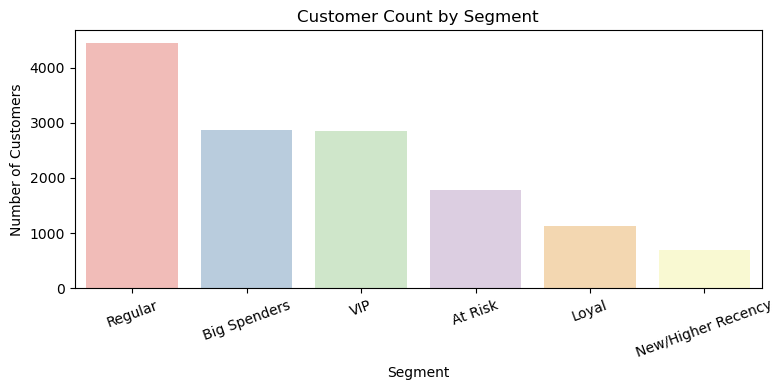

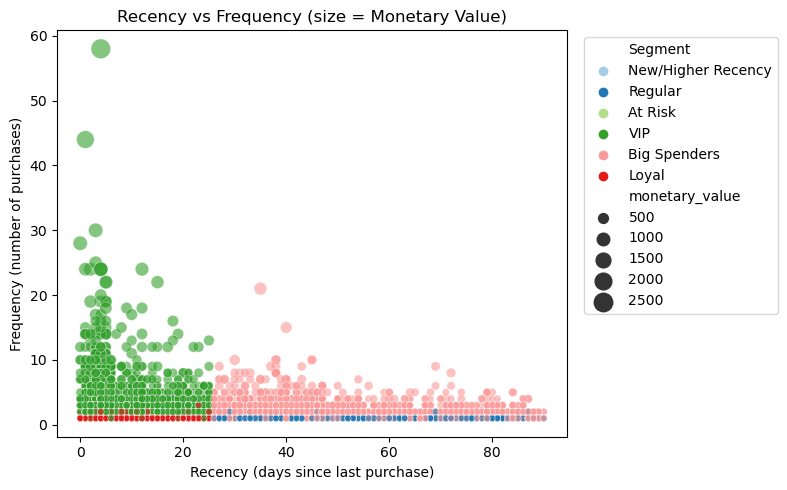

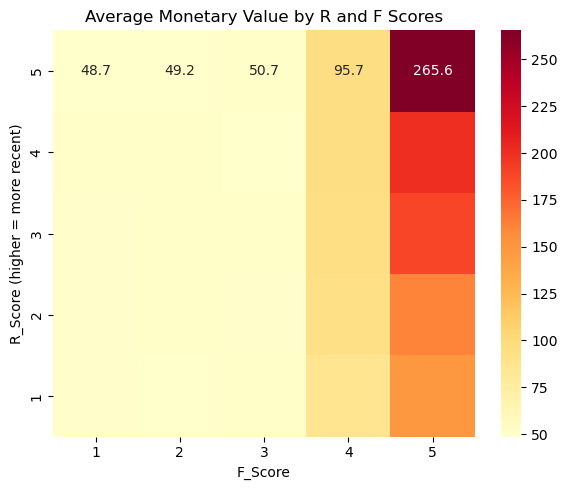

In [35]:
# ------------------------------------------------------------------------------
# 1. Imports and data loading (adjust file path as needed)
# ------------------------------------------------------------------------------

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ipywidgets import interact, Dropdown

# Ensure charts render inline in notebooks
%matplotlib inline

def load_rfm_data(path: str) -> pd.DataFrame:
    """
    Load the RFM dataset from a CSV file.

    Parameters
    ----------
    path : str
        Relative or absolute path to the CSV file.

    Returns
    -------
    pd.DataFrame
        DataFrame containing the RFM data with columns:
        - customer
        - recency
        - frequency
        - monetary_value
        - R_Score, F_Score, M_Score
        - RFMClass_text (e.g., "543")
        - Segment (e.g., "VIP", "Loyal", "Regular", etc.)
    """
    df = pd.read_csv(path)
    return df

# Load your previously exported file (or point to rfm-segmentation.csv if you haven't saved the export)
rfm = load_rfm_data(r"C:\Users\Murtaza\Downloads\RFM-analysis-master\rfm_for_bi.csv")
print(f"Loaded {len(rfm)} rows.")


# ------------------------------------------------------------------------------
# 2. Exploratory Data Analysis (EDA)
# ------------------------------------------------------------------------------

def eda_summary(df: pd.DataFrame) -> None:
    """
    Show basic EDA outputs: data types, missing values, and summary stats.
    """
    print("\n--- Data Types ---")
    print(df.dtypes)

    print("\n--- Missing Values ---")
    print(df.isnull().sum())

    print("\n--- Summary Statistics ---")
    display(df.describe())

# Run EDA
eda_summary(rfm)


# ------------------------------------------------------------------------------
# 3. Dashboards & Visualizations
# ------------------------------------------------------------------------------

# 3.1 Segment distribution (bar chart)
def plot_segment_distribution(df: pd.DataFrame) -> None:
    """
    Plot the distribution of customers across segments.
    """
    plt.figure(figsize=(8, 4))
    order = df["Segment"].value_counts().index
    sns.countplot(data=df, x="Segment", order=order, palette="Pastel1")
    plt.title("Customer Count by Segment")
    plt.xlabel("Segment")
    plt.ylabel("Number of Customers")
    plt.xticks(rotation=20)
    plt.tight_layout()
    plt.show()

plot_segment_distribution(rfm)

# 3.2 Scatter plot: Recency vs Frequency with Monetary size & segment color
def plot_recency_frequency_scatter(df: pd.DataFrame) -> None:
    """
    Scatter plot of recency vs frequency, with point size representing monetary value
    and color representing the customer segment.
    """
    plt.figure(figsize=(8, 5))
    sns.scatterplot(
        data=df,
        x="recency",
        y="frequency",
        hue="Segment",
        size="monetary_value",
        sizes=(20, 200),
        alpha=0.6,
        palette="Paired"
    )
    plt.title("Recency vs Frequency (size = Monetary Value)")
    plt.xlabel("Recency (days since last purchase)")
    plt.ylabel("Frequency (number of purchases)")
    plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

plot_recency_frequency_scatter(rfm)

# 3.3 Heatmap: Average monetary value by R_Score and F_Score
def plot_r_f_heatmap(df: pd.DataFrame) -> None:
    """
    Create a heatmap where rows are R_Score and columns are F_Score,
    colored by the average monetary value of customers in each cell.
    """
    pivot_table = (
        df
        .groupby(["R_Score", "F_Score"])["monetary_value"]
        .mean()
        .reset_index()
        .pivot(index="R_Score", columns="F_Score", values="monetary_value")
        .sort_index(ascending=False)  # So higher R_Score (more recent) appears at top
    )
    plt.figure(figsize=(6, 5))
    sns.heatmap(pivot_table, annot=True, fmt=".1f", cmap="YlOrRd")
    plt.title("Average Monetary Value by R and F Scores")
    plt.xlabel("F_Score")
    plt.ylabel("R_Score (higher = more recent)")
    plt.tight_layout()
    plt.show()

plot_r_f_heatmap(rfm)

# 3.4 Interactive scatter with segment filter
def interactive_scatter(df: pd.DataFrame) -> None:
    """
    Create an interactive scatter plot with a dropdown filter for segments.
    """
    segments = ["All"] + sorted(df["Segment"].unique())

    @interact(segment=Dropdown(options=segments, description="Segment:", value="All"))
    def update_plot(segment: str = "All"):
        if segment == "All":
            data = df
            title = "Recency vs Frequency (All Segments)"
        else:
            data = df[df["Segment"] == segment]
            title = f"Recency vs Frequency – {segment}"

        plt.figure(figsize=(8, 5))
        sns.scatterplot(
            data=data,
            x="recency",
            y="frequency",
            hue="Segment",
            size="monetary_value",
            sizes=(20, 200),
            alpha=0.6,
            palette="Paired"
        )
        plt.title(title)
        plt.xlabel("Recency (days since last purchase)")
        plt.ylabel("Frequency (number of purchases)")
        plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
        plt.tight_layout()
        plt.show()

# Uncomment the line below to activate the interactive widget
# interactive_scatter(rfm)



In [39]:
# If you already have X_train, X_test, y_train, y_test — SKIP THIS CELL.
# For demo: define a binary target (VIP vs others) from RFM and do a simple split.

from sklearn.model_selection import train_test_split

rfm_demo = rfm.copy()
rfm_demo["is_vip"] = (rfm_demo["Segment"] == "VIP").astype(int)
X = rfm_demo[["recency","frequency","monetary_value"]]
y = rfm_demo["is_vip"]
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)


In [40]:
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

def fit_models_for_roc(X_train, y_train):
    models = {
        "LogReg": Pipeline([
            ("scaler", StandardScaler()),
            ("clf", LogisticRegression(max_iter=500, class_weight="balanced"))
        ]),
        "RandomForest": RandomForestClassifier(
            n_estimators=300, random_state=42, n_jobs=-1
        ),
        "GradientBoosting": GradientBoostingClassifier(random_state=42),
        "KNN": Pipeline([
            ("scaler", StandardScaler()),
            ("clf", KNeighborsClassifier(n_neighbors=7))
        ]),
        "SVM": Pipeline([
            ("scaler", StandardScaler()),
            ("clf", SVC(kernel="rbf", probability=True, random_state=42))
        ])
    }
    for name, mdl in models.items():
        mdl.fit(X_train, y_train)
    return models

models = fit_models_for_roc(X_train, y_train)


In [41]:
import plotly.graph_objects as go
import plotly.express as px
from sklearn.metrics import roc_curve, auc, roc_auc_score
import pandas as pd

def model_scores_for_roc(models, X_test, y_test):
    rows = []
    curves = {}
    for name, mdl in models.items():
        # probability if available, else scaled decision_function
        if hasattr(mdl, "predict_proba"):
            y_score = mdl.predict_proba(X_test)[:, 1]
        else:
            scores = mdl.decision_function(X_test)
            smin, smax = scores.min(), scores.max()
            y_score = (scores - smin) / (smax - smin + 1e-12)

        fpr, tpr, _ = roc_curve(y_test, y_score)
        rocAUC = auc(fpr, tpr)
        rows.append({"Model": name, "ROC_AUC": rocAUC})
        curves[name] = (fpr, tpr)
    df_auc = pd.DataFrame(rows).sort_values("ROC_AUC", ascending=False).reset_index(drop=True)
    return df_auc, curves

auc_df, curves = model_scores_for_roc(models, X_test, y_test)
display(auc_df.style.format({"ROC_AUC": "{:.3f}"}))

# Interactive ROC plot
fig = go.Figure()
for name, (fpr, tpr) in curves.items():
    fig.add_trace(go.Scatter(
        x=fpr, y=tpr, mode="lines", name=f"{name} (AUC={auc_df.loc[auc_df['Model']==name, 'ROC_AUC'].values[0]:.3f})"
    ))
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode="lines", name="Random", line=dict(dash="dash", width=1), showlegend=True))
fig.update_layout(
    title="ROC Curves — All Models (Plotly)",
    xaxis_title="False Positive Rate",
    yaxis_title="True Positive Rate",
    template="plotly_white",
    width=800, height=600
)
fig.show()

# Export HTML (optional)
fig.write_html("rfm_models_roc_plotly.html", include_plotlyjs="cdn")
print("Saved: rfm_models_roc_plotly.html")


,Model,ROC_AUC
0,GradientBoosting,1.000
1,RandomForest,1.000
2,SVM,1.000
3,KNN,0.999
4,LogReg,0.982


Saved: rfm_models_roc_plotly.html


In [45]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# --- styling & order ---
SEG_ORDER = ["VIP","Loyal","Big Spenders","New/Higher Recency","Regular","At Risk"]
SEG_COLORS = {
    "VIP": "#2E86AB", "Loyal": "#28B463", "Big Spenders": "#8E44AD",
    "New/Higher Recency": "#F39C12", "Regular": "#7F8C8D", "At Risk": "#E74C3C",
}

def subset_for(df, seg):
    return df if seg == "All" else df[df["Segment"].astype(str) == seg]

def kpi_numbers(df):
    customers = df["customer"].nunique() if "customer" in df.columns else len(df)
    vip_pct = float((df["Segment"].eq("VIP").mean() * 100) if len(df) else 0.0)
    total_m = float(df["monetary_value"].sum())
    avg_m = float(df["monetary_value"].mean()) if len(df) else 0.0
    return customers, vip_pct, total_m, avg_m

def kpi_traces(df):
    c, vip, tm, am = kpi_numbers(df)
    t1 = go.Indicator(mode="number", value=c, title={"text":"Customers"})
    t2 = go.Indicator(mode="number", value=vip, number={"suffix":"%"}, title={"text":"VIP %"})
    t3 = go.Indicator(mode="number", value=tm, number={"valueformat": ",.0f"}, title={"text":"Total Monetary"})
    t4 = go.Indicator(mode="number", value=am, number={"valueformat": ",.0f"}, title={"text":"Avg Monetary"})
    return [t1, t2, t3, t4]

def bar_trace(df):
    counts = (df["Segment"].value_counts().reindex(SEG_ORDER).fillna(0)).astype(int)
    return go.Bar(
        x=SEG_ORDER, y=counts.values,
        marker_color=[SEG_COLORS[s] for s in SEG_ORDER],
        text=counts.values, textposition="outside",
        hovertemplate="Segment: %{x}<br>Customers: %{y}<extra></extra>",
        name="Segment Count"
    )

def treemap_trace(df):
    counts = (df["Segment"].value_counts().reindex(SEG_ORDER).fillna(0)).astype(int)
    return go.Treemap(
        labels=SEG_ORDER, parents=[""]*len(SEG_ORDER), values=counts.values,
        marker_colors=[SEG_COLORS[s] for s in SEG_ORDER],
        hovertemplate="%{label}<br>Customers: %{value}<extra></extra>",
        name="Treemap"
    )

def scatter_trace(df):
    colors = df["Segment"].map(SEG_COLORS)
    size = np.clip(df["monetary_value"] / df["monetary_value"].quantile(0.90) * 26, 6, 26)
    hover = (
        "Customer: " + (df["customer"].astype(str) if "customer" in df.columns else pd.Series(["N/A"]*len(df))) +
        "<br>Recency: " + df["recency"].astype(str) +
        "<br>Frequency: " + df["frequency"].astype(str) +
        "<br>Monetary: " + df["monetary_value"].round(0).astype(int).astype(str) +
        "<br>RFM: " + df["RFMClass_text"].astype(str)
    )
    return go.Scatter(
        x=df["recency"], y=df["frequency"], mode="markers",
        marker=dict(size=size, color=colors, opacity=0.75, line=dict(width=0.4, color="#333")),
        hovertext=hover, hoverinfo="text", name="R×F"
    )

def heatmap_trace(df):
    mat = (df.groupby(["R_Score","F_Score"])["monetary_value"]
              .mean().reset_index()
              .pivot(index="R_Score", columns="F_Score", values="monetary_value")
              .sort_index(ascending=False))
    return go.Heatmap(
        z=mat.values, x=mat.columns, y=mat.index,
        coloraxis="coloraxis",
        hovertemplate="R:%{y} • F:%{x}<br>Avg M: %{z:.1f}<extra></extra>",
        name="Heatmap"
    )

def build_fig(df):
    segments = ["All"] + SEG_ORDER

    # 3x4 grid: KPIs on row1 (4 cells), Bar+Treemap row2, Scatter+Heatmap row3
    fig = make_subplots(
        rows=3, cols=4,
        specs=[
            [{"type":"indicator"}, {"type":"indicator"}, {"type":"indicator"}, {"type":"indicator"}],
            [{"type":"xy","colspan":2}, None, {"type":"domain","colspan":2}, None],
            [{"type":"xy","colspan":2}, None, {"type":"heatmap","colspan":2}, None],
        ],
        subplot_titles=("Customers","VIP %","Total Monetary","Avg Monetary",
                        "Segment Bar","Treemap","Recency vs Frequency","R×F Heatmap"),
        vertical_spacing=0.12, horizontal_spacing=0.06
    )

    fig.update_layout(
        template="plotly_white", height=950, width=1150,
        margin=dict(t=90, l=40, r=30, b=50),
        title=dict(text="RFM Customer Segmentation — Interactive Dashboard", x=0.5, xanchor="center"),
        font=dict(family="Segoe UI, Arial", size=13),
        coloraxis=dict(colorscale="YlOrRd")
    )

    # Initial (All)
    d0 = subset_for(df, "All")
    k1,k2,k3,k4 = kpi_traces(d0)
    fig.add_trace(k1, 1,1); fig.add_trace(k2, 1,2); fig.add_trace(k3, 1,3); fig.add_trace(k4, 1,4)
    fig.add_trace(bar_trace(d0), 2,1)
    fig.add_trace(treemap_trace(d0), 2,3)
    fig.add_trace(scatter_trace(d0), 3,1)
    fig.add_trace(heatmap_trace(d0), 3,3)

    fig.update_xaxes(title_text="Recency (days)", row=3, col=1)
    fig.update_yaxes(title_text="Frequency (# orders)", row=3, col=1)

    # Frames (same 8 traces order per frame)
    frames = []
    for seg in segments:
        d = subset_for(df, seg)
        k1,k2,k3,k4 = kpi_traces(d)
        frames.append(go.Frame(
            name=seg,
            data=[k1,k2,k3,k4, bar_trace(d), treemap_trace(d), scatter_trace(d), heatmap_trace(d)]
        ))
    fig.frames = frames

    # Dropdown (animate frames)
    fig.update_layout(
        updatemenus=[dict(
            type="dropdown", x=0.0, y=1.12, xanchor="left",
            buttons=[dict(label=seg, method="animate",
                          args=[[seg], {"frame":{"duration":0, "redraw":True}, "mode":"immediate"}])
                     for seg in segments]
        )]
    )
    return fig

fig = build_fig(rfm)
fig.show()
fig.write_html("rfm_plotly_dashboard_clean.html", include_plotlyjs="cdn")
print("Saved: rfm_plotly_dashboard_clean.html")


Saved: rfm_plotly_dashboard_clean.html
